**` Explode MultiLineString to Individual LineStrings`**

In [ ]:
from geopandas import GeoDataFrame
import geopandas as gpd
import matplotlib.pyplot as plt
rivers = gpd.read_file(
  "https://naturalearth.s3.amazonaws.com/10m_physical/ne_10m_rivers_lake_centerlines.zip"
)


In [ ]:
print(rivers.columns)

Index(['dissolve', 'scalerank', 'featurecla', 'name', 'name_alt', 'rivernum',
       'note', 'min_zoom', 'name_en', 'min_label', 'ne_id', 'label',
       'wikidataid', 'name_ar', 'name_bn', 'name_de', 'name_es', 'name_fr',
       'name_el', 'name_hi', 'name_hu', 'name_id', 'name_it', 'name_ja',
       'name_ko', 'name_nl', 'name_pl', 'name_pt', 'name_ru', 'name_sv',
       'name_tr', 'name_vi', 'name_zh', 'name_fa', 'name_he', 'name_uk',
       'name_ur', 'name_zht', 'geometry'],
      dtype='object')


In [ ]:
total=len(rivers)
print(total)

1473


In [ ]:
multilines=rivers[rivers.geometry.type=="MultiLineString"]
print(len(multilines))

420


In [ ]:
linestring=rivers[rivers.geometry.type=="LineString"]
print(len(linestring))

1053


Before explode: 1473
After explode: 2269


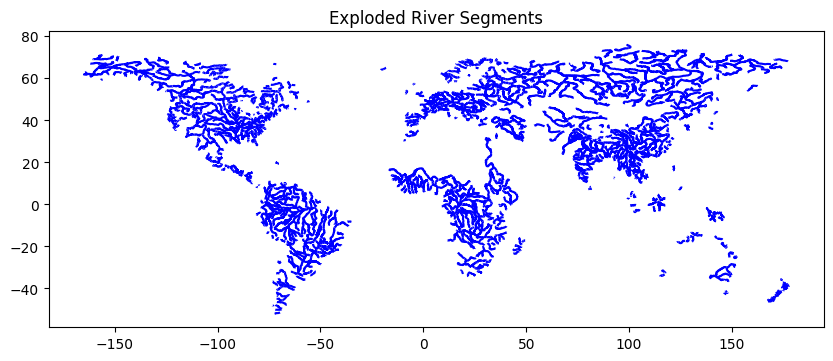

In [ ]:
#A MultiLineString is a single geometry object that contains multiple LineStrings.
rivers_exploded = rivers.explode(index_parts=False, ignore_index=True)


print("Before explode:", len(rivers))
print("After explode:", len(rivers_exploded))

# Plot exploded rivers
rivers_exploded.plot(figsize=(10, 5), color='blue')
plt.title("Exploded River Segments")
plt.show()


**unary_union ** :is a geometric operation that:
Combines all geometries in a GeoSeries (or GeoDataFrame) into a single geometry.

<class 'shapely.geometry.multilinestring.MultiLineString'>


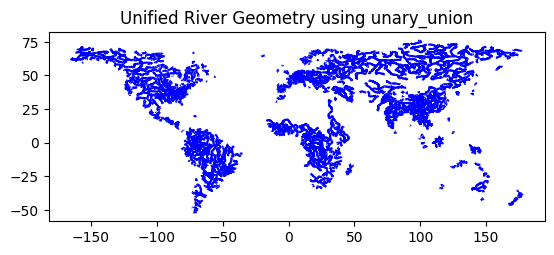

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt


# Apply unary_union
river_merged = rivers_exploded.unary_union

print(type(river_merged))

# Optional: Wrap it back into a GeoDataFrame to plot
merged_gdf = gpd.GeoDataFrame(geometry=[river_merged], crs=rivers.crs)

# Plot
merged_gdf.plot(color='blue')
plt.title("Unified River Geometry using unary_union")
plt.show()


In [ ]:
pip install geopandas folium


In [ ]:
pip install mapclassify

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 882.2/882.2 kB 9.2 MB/s eta 0:00:00


In [ ]:
rivers.explore()